In [1]:
from skimage import data, io
import numpy as np
import matplotlib.pyplot as plt
from typing import List

# Get Image Mean

Wall time: 4.71 ms


<Figure size 432x288 with 0 Axes>

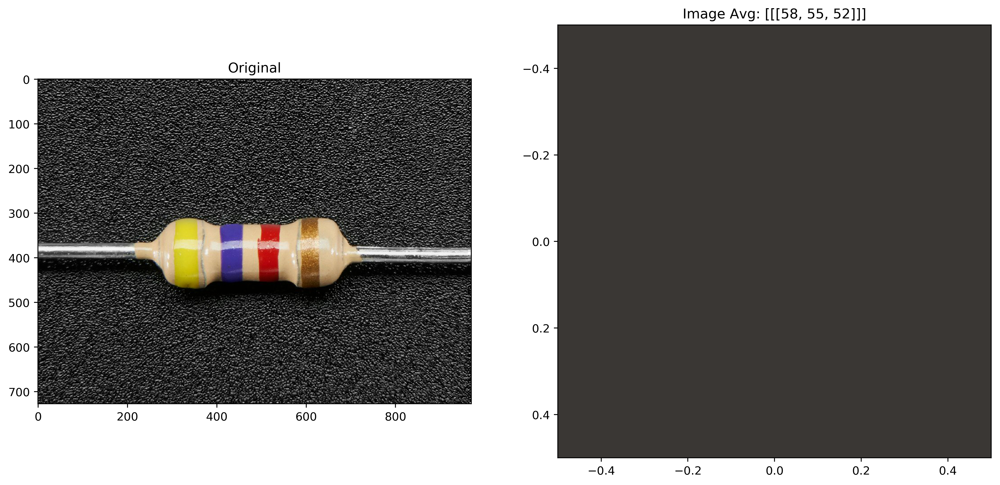

In [111]:
cat = data.chelsea()
astro = data.astronaut()
coffee = data.coffee()
resistor = io.imread("imgs/res3.jpg")
def getAvgColor(img: List[List[List[np.uint8]]]) -> List[np.uint8]:
    return [int(np.mean(img[:,:,0])), int(np.mean(img[:,:,1])), int(np.mean(img[:,:,2]))]

original = resistor
avg = [[getAvgColor(original)]]

#plotting figures
fig = plt.figure()
plt.subplots(1, 2, figsize=(15,15), dpi=400)
plt.subplot(1, 2, 1, title="Original")
plt.imshow(original)

plt.subplot(1, 2, 2, title="Image Avg: {}".format(avg))
plt.imshow(avg)


# Get Image Mode

Wall time: 2.12 s
[[[15, 15, 15]]]


<Figure size 432x288 with 0 Axes>

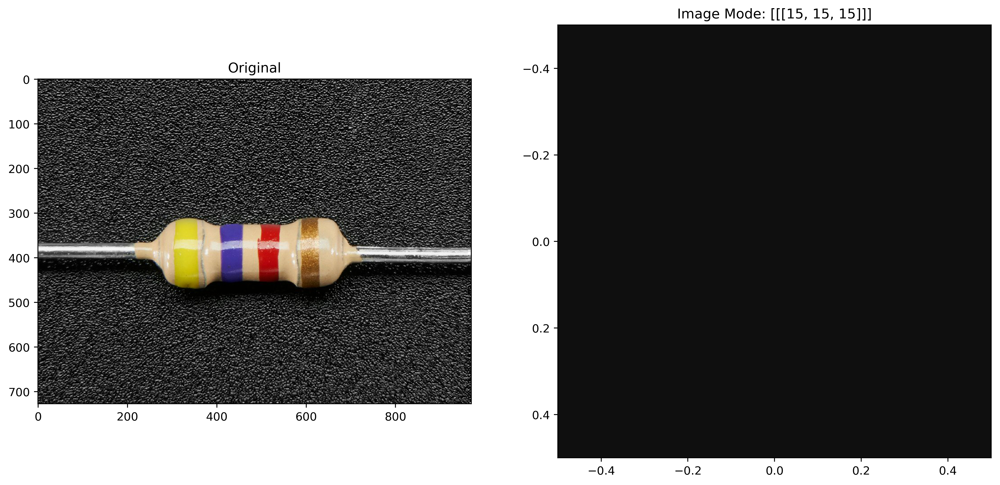

In [137]:
def getModeColor(img):
    flattened = np.array(img).reshape(len(img)*len(img[0]), 3)
    pixel_set = set()
    hist = {}
    for pixel in flattened:
        r = int(pixel[0])
        g = int(pixel[1])
        b = int(pixel[2])
        key = str(r) + "," + str(g) + "," + str(b)
        if key in pixel_set:
            hist[key] += 1
        else:
            hist[key] = 1
    maximum = 0
    mode_key = ""
    for key in hist:
        if hist[key] > maximum:
            maximum = hist[key]
            mode_key = key
    mode = [int(x) for x in mode_key.split(",")]
    return mode

%time mode = [[getModeColor(original)]]
print(mode)

#plotting figures
fig = plt.figure()
plt.subplots(1, 2, figsize=(15,15), dpi=400)
plt.subplot(1, 2, 1, title="Original")
plt.imshow(original)

plt.subplot(1, 2, 2, title="Image Mode: {}".format(mode))
plt.imshow(mode)

# Average the Mean and Mode
### That should be close to the background color

<Figure size 432x288 with 0 Axes>

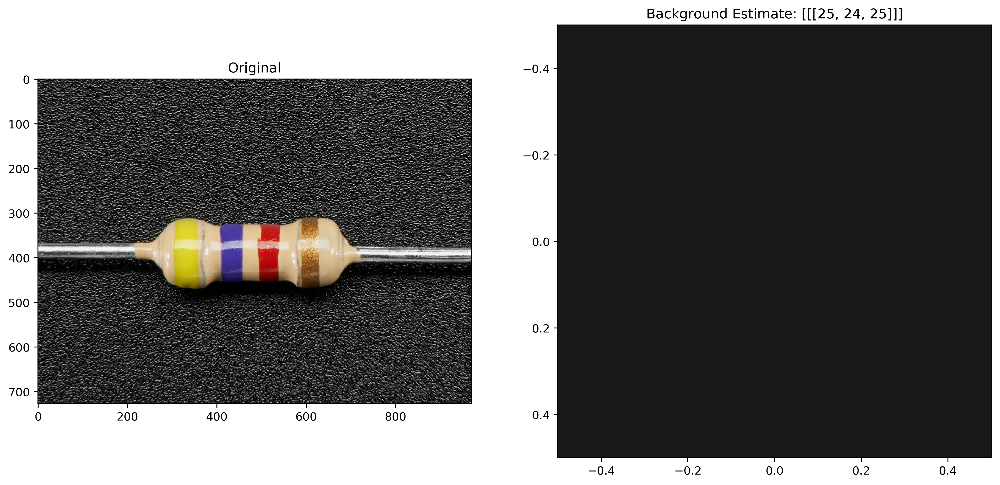

In [93]:
def getBackground(img):
    mode = getModeColor(img)
    avg = getAvgColor(img)
    return [[[(int(.25*avg[i]+ .75*mode[i])) for i in range(3)]]]

bgrnd_est = getBackground(original)

#plotting figures
fig = plt.figure()
plt.subplots(1, 2, figsize=(15,15), dpi=400)
plt.subplot(1, 2, 1, title="Original")
plt.imshow(original)

plt.subplot(1, 2, 2, title="Background Estimate: {}".format(bgrnd_est))
plt.imshow(bgrnd_est)

<Figure size 432x288 with 0 Axes>

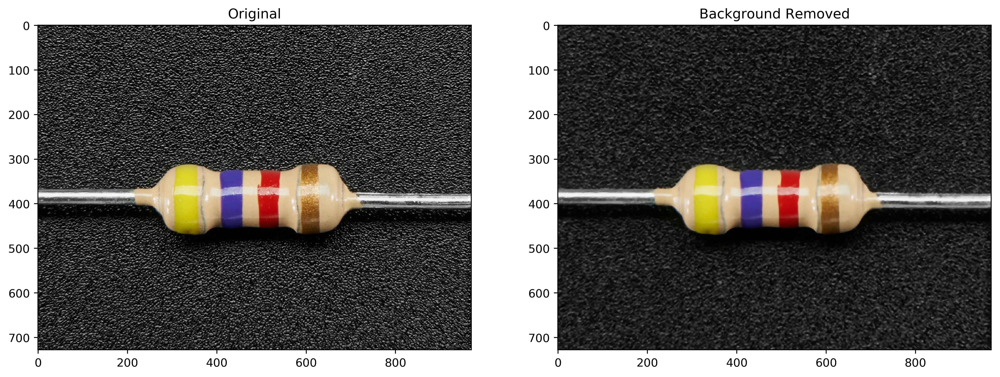

In [85]:
medianBlur = cv2.medianBlur(original,5)

#plotting figures
fig = plt.figure()
plt.subplots(1, 2, figsize=(15,15), dpi=400)
plt.subplot(1, 2, 1, title="Original")
plt.imshow(original)

plt.subplot(1, 2, 2, title="Background Removed")
plt.imshow(medianBlur)

<Figure size 432x288 with 0 Axes>

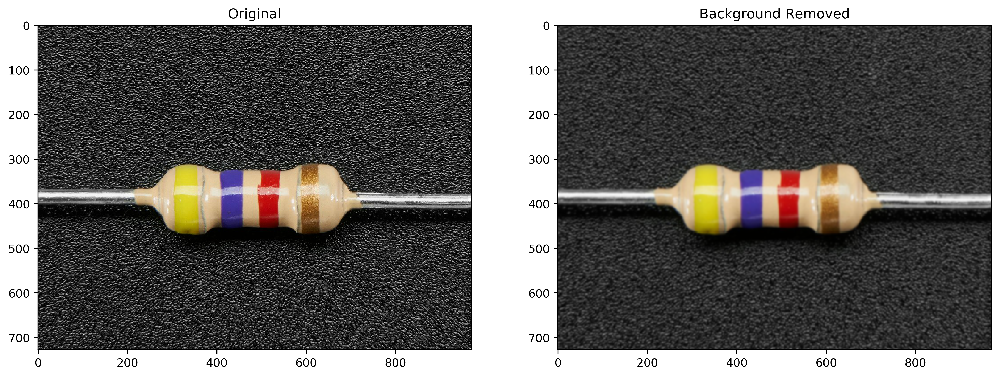

In [82]:
GaussianBlur = cv2.GaussianBlur(original,(9,9),0)

#plotting figures
fig = plt.figure()
plt.subplots(1, 2, figsize=(15,15), dpi=400)
plt.subplot(1, 2, 1, title="Original")
plt.imshow(original)

plt.subplot(1, 2, 2, title="Background Removed")
plt.imshow(blur)

<Figure size 432x288 with 0 Axes>

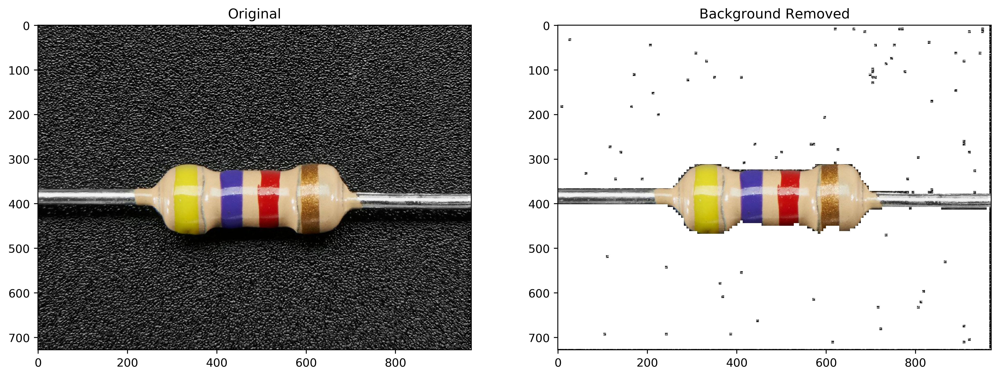

In [95]:
def removeBackground(img: List[List[List[np.uint8]]], bg: List[np.uint8], blockSize=4, distThresh=40) -> List[List[List[np.uint8]]]:
    blur = cv2.medianBlur(original,5)
    copy = np.copy(img)
    height = len(img)
    width = len(img[0])
    i = 0
    while i + blockSize < height:
        j = 0
        while j + blockSize < width:
            block = blur[i:i+blockSize, j:j+blockSize]
            block_flat = block.reshape(blockSize**2, 3)
            avgs = [int(np.mean(block_flat[:,0])), int(np.mean(block_flat[:,1])), int(np.mean(block_flat[:,2]))]
            dist = np.linalg.norm(np.array(avgs) - np.array(bg))
            
            if dist <= distThresh:
                copy[i:i+blockSize, j:j+blockSize] = [255, 255, 255]
            
            j += blockSize
        
        i += blockSize
    
    return copy

no_background = removeBackground(img=original, bg=bgrnd_est, blockSize=6, distThresh=60)


#plotting figures
fig = plt.figure()
plt.subplots(1, 2, figsize=(15,15), dpi=400)
plt.subplot(1, 2, 1, title="Original")
plt.imshow(original)

plt.subplot(1, 2, 2, title="Background Removed")
plt.imshow(no_background)

<Figure size 432x288 with 0 Axes>

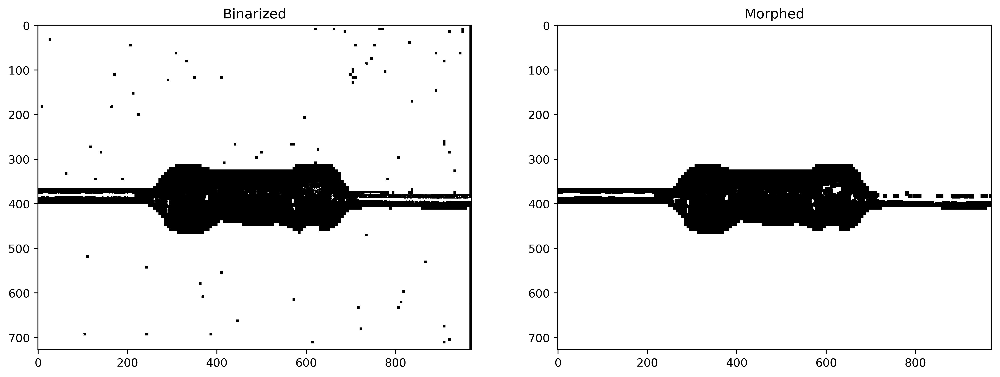

In [107]:
ret, bin_img = cv2.threshold( cv2.cvtColor(no_background, cv2.COLOR_RGB2GRAY), 230,255,0)
kernel = np.ones((9,9),np.uint8)
morphed = cv2.morphologyEx(bin_img, cv2.MORPH_CLOSE, kernel)

#plotting figures
fig = plt.figure()
plt.subplots(1, 2, figsize=(15,15), dpi=400)
plt.subplot(1, 2, 1, title="Binarized")
plt.imshow(bin_img, cmap='gray')

plt.subplot(1, 2, 2, title="Morphed")
plt.imshow(morphed, cmap='gray')

# Column Averaging

In [54]:
import cv2

C:\Users\willworthington\Anaconda3\lib\site-packages\skimage\io\_io.py:140: UserWarning: res_flattened.jpg is a low contrast image
  warn('%s is a low contrast image' % fname)
C:\Users\willworthington\Anaconda3\lib\site-packages\skimage\util\dtype.py:137: UserWarning: Possible sign loss when converting negative image of type int32 to positive image of type uint8.
  .format(dtypeobj_in, dtypeobj_out))
C:\Users\willworthington\Anaconda3\lib\site-packages\skimage\util\dtype.py:190: UserWarning: Downcasting int32 to uint8 without scaling because max value 229 fits in uint8
  "value {} fits in {}".format(a.dtype, dtype, a.max(), dtype))


<Figure size 432x288 with 0 Axes>

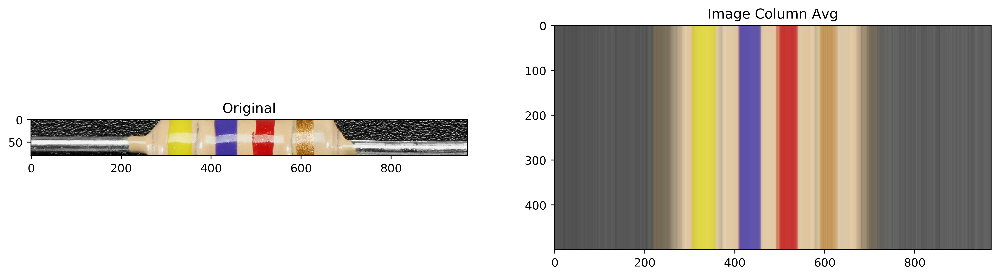

In [63]:
def columnsAvg(img: List[List[List[np.uint8]]]) -> List[List[np.uint8]]:
    image = cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)
    columns = []
    #now take mean across rows (originally columns)
    for col in image:
        avgs = [int(np.mean(col[:,0])), int(np.mean(col[:,1])), int(np.mean(col[:,2]))]
        columns.append(avgs)
    return columns

img_subsection = original[330:410]
colAvg = [columnsAvg(img_subsection)]
#print(colAvg)
io.imsave("res_flattened.jpg", np.array(colAvg), dtype=np.uint8)

#plotting figures
fig = plt.figure()
plt.subplots(1, 2, figsize=(15,15), dpi=400)
plt.subplot(1, 2, 1, title="Original")
plt.imshow(img_subsection)

plt.subplot(1, 2, 2, title="Image Column Avg")
plt.imshow(colAvg*500)

# Column Mode

<Figure size 432x288 with 0 Axes>

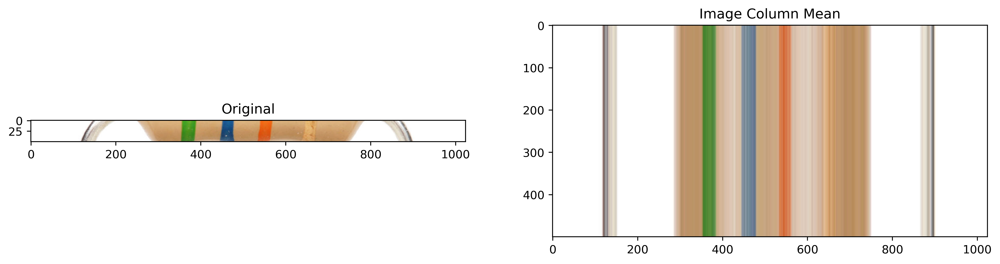

In [56]:
def columnsMode(img: List[List[List[np.uint8]]]) -> List[List[np.uint8]]:
    image = cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)
    columns = []
    pixel_set = set()
    for col in image:
        hist = {}
        for pixel in col:
            r = int(pixel[0])
            g = int(pixel[1])
            b = int(pixel[2])
            #print(r,g,b)
            key = str(r) + "," + str(g) + "," + str(b)
            if key in pixel_set:
                hist[key] += 1
            else:
                hist[key] = 1
        maximum = 0
        mode_key = ""
        for key in hist:
            if hist[key] > maximum:
                maximum = hist[key]
                mode_key = key
        mode = [int(x) for x in mode_key.split(",")]
        columns.append(mode)
    return columns

#img_subsection = original[80:200]
colMode = [columnsMode(img_subsection)]
#print(colMode)

#plotting figures
fig = plt.figure()
plt.subplots(1, 2, figsize=(15,15), dpi=400)
plt.subplot(1, 2, 1, title="Original")
plt.imshow(img_subsection)

plt.subplot(1, 2, 2, title="Image Column Mean")
plt.imshow(colMode*500)

<Figure size 432x288 with 0 Axes>

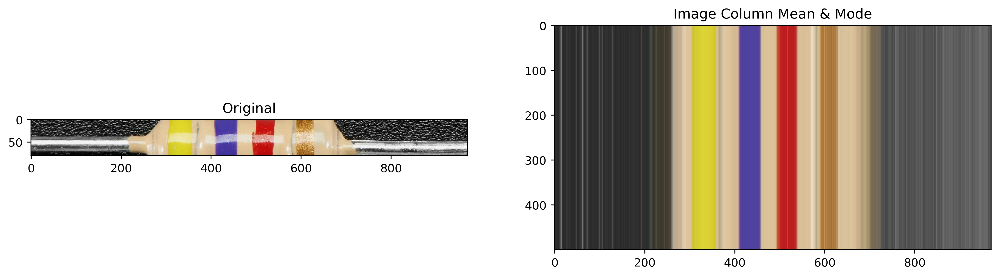

In [65]:
def columnsWeightedAvg(img: List[List[List[np.uint8]]]) -> List[List[np.uint8]]:
    mean = columnsAvg(img)
    mode = columnsMode(img)
    columns = [ [int(.5*mean[i][0] + .5*mode[i][0]), int(.5*mean[i][1] + .5*mode[i][1]), int(.5*mean[i][2] + .5*mode[i][2])] for i in range(len(mean))]
    return columns

#img_subsection = original[80:200, 200:800]
colWeighted = [columnsWeightedAvg(img_subsection)]
#print(colWeighted)

#plotting figures
fig = plt.figure()
plt.subplots(1, 2, figsize=(15,15), dpi=400)
plt.subplot(1, 2, 1, title="Original")
plt.imshow(img_subsection)

plt.subplot(1, 2, 2, title="Image Column Mean & Mode")
plt.imshow(colWeighted*500)

In [64]:
for i, pixel in enumerate(colAvg[0]):
    print("{}:\t{}\n".format(i, pixel))

0:	[79, 79, 79]

1:	[82, 82, 82]

2:	[84, 84, 84]

3:	[87, 87, 87]

4:	[88, 88, 88]

5:	[85, 85, 85]

6:	[83, 83, 83]

7:	[83, 83, 83]

8:	[84, 84, 84]

9:	[85, 85, 85]

10:	[85, 85, 85]

11:	[86, 86, 86]

12:	[84, 84, 84]

13:	[83, 83, 83]

14:	[84, 84, 84]

15:	[87, 87, 87]

16:	[85, 85, 85]

17:	[84, 84, 84]

18:	[83, 83, 83]

19:	[79, 79, 79]

20:	[78, 78, 78]

21:	[76, 76, 76]

22:	[76, 76, 76]

23:	[79, 79, 79]

24:	[82, 82, 82]

25:	[86, 86, 86]

26:	[85, 85, 85]

27:	[84, 84, 84]

28:	[82, 82, 82]

29:	[81, 81, 81]

30:	[81, 81, 81]

31:	[79, 79, 79]

32:	[80, 80, 80]

33:	[84, 84, 84]

34:	[85, 85, 85]

35:	[83, 83, 83]

36:	[82, 82, 82]

37:	[80, 80, 80]

38:	[80, 80, 80]

39:	[79, 79, 79]

40:	[80, 80, 80]

41:	[82, 82, 82]

42:	[81, 81, 81]

43:	[81, 81, 81]

44:	[81, 81, 81]

45:	[79, 79, 79]

46:	[80, 80, 80]

47:	[79, 79, 79]

48:	[79, 79, 79]

49:	[80, 80, 80]

50:	[80, 80, 80]

51:	[84, 84, 84]

52:	[83, 83, 83]

53:	[82, 82, 82]

54:	[81, 81, 81]

55:	[83, 83, 83]

56